# Exploring Querying

In [1]:
"""Load Data
Structure:
    1. Imports, Variables, Functions
    2. Load Data
"""

# 1. Imports, Variables, Functions
# imports
import pandas as pd, numpy as np, os, sys
import anndata as ad
import logging
from typing import *
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import json
from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
)
from sklearn.metrics import confusion_matrix, classification_report
import sys
sys.path.append(os.path.join("..", ".."))
from src.utils import utils as ut
from src.utils import viz as vz
from src.utils import io 
logging.basicConfig(level=logging.INFO)

# variables
# run_dir = os.path.join("..","..","outputs","run-25-09-28-05") 
run_dir = os.path.join("..","..","outputs","run-25-09-13-18") 
# run_dir = os.path.join("..","..","outputs","run-25-10-05-01") 
# run_dir = os.path.join("..","..","outputs","run-25-09-17-01") 

embedding_type = "ft"

assert embedding_type in ["ft", "pt", "raw"]
if embedding_type == "ft":
    output_dir = os.path.join(run_dir, "outputs")
elif embedding_type == "pt":
    run_name = run_dir.split("/")[-1]
    output_dir = os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "outputs")
elif embedding_type == "raw":
    run_name = run_dir.split("/")[-1]
    output_dir = os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "outputs")

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# functions

# 2. Load Data
(
    # split,
    predictions_test,
    labels_test,
    results_test,
    all_outputs_test,
    predictions_valid,
    labels_valid,
    results_valid,
    all_outputs_valid,
    predictions_train,
    labels_train,
    results_train,
    all_outputs_train,
    adata_orig,
    id2type,
    train_indices,
    valid_indices,
) = io.load_run_output(run_dir)

# load json

with open(os.path.join(run_dir, "parameters.json"), "r") as f:
    parameters = json.load(f)

for k, v in parameters.items():
    print(f"{k}: {v}")

Nº of loaded variables 16
data_path: /aloy/home/ddalton/projects/scGPT_playground/data/pp_data-25-09-12-01/data.h5ad
max_seq_len: 3501
batch_size: 16
gene_presence_pct: 0.9
benchmark_data: False
split_type: stratified
val_split_type: rand_stratified
n_splits: 10
n_tested_splits: 10
epochs: 50
gene_filtering: top_presence
sample_presence_pct: 0.3
MLM: False
CLS: False
CLS_multilabel: True
DAB: False
ADV: False
CCE: False
ecs_thres: 0.0
dab_weight: 0.0
use_fast_transformer: True
output_attentions: False
INPUT_BATCH_LABELS: False
do_combat: False
ontology: do
scgpt_pp: norm_log1p
description: no control loss
library: RNA-Seq
use_controls: True


In [2]:
import importlib
import scanpy as sc

importlib.reload(ut)
importlib.reload(vz)

split_idx = 0

# load all adata
adata_test =  sc.read(
    os.path.join(run_dir, f"adata_test_{split_idx+1}.h5ad"), backed="r"
)
adata_test.obs.reset_index(drop=True, inplace=True)  
adata_valid =  sc.read(
    os.path.join(run_dir, f"adata_valid_{split_idx+1}.h5ad"), backed="r"
)
adata_valid.obs.reset_index(drop=True, inplace=True)  
adata_train =  sc.read(
    os.path.join(run_dir, f"adata_train_{split_idx+1}.h5ad"), backed="r"
)
adata_train.obs.reset_index(drop=True, inplace=True)  

In [3]:
"""0.2 Load Disease Ontology Pairs
Load pairs of related and unrelated diseases from the Disease Ontology.
Structure:
    1. Imports, Variables, Functions
    2. Load Disease Pairs

"""
# 1. Imports, Variables, Functions
# imports


# variables

# functions


# 2. Load Disease Pairs

# Get disease IDs
d_ids = list(adata_train.obs["doid_id"].unique())

# load Disease Ontology Lin Similarity amongst pairs!
do_df_ic = ut.load_df_do_pairs()
print(f"Loaded universe of disease pairs: {do_df_ic.shape[0]}") 

# Load IC based similarity 
do_graph = ut.load_do_graph()
doid_to_term = {
    node: data["name"] for node, data in do_graph.nodes(data=True) if "name" in data
}


# get top 1% & 5% of values
ic_thr = np.quantile(do_df_ic["lin"].values, 0.95)
print(f"IC Threshold: {ic_thr:.3f}\tNº of pairss {len(do_df_ic.query('lin>@ic_thr'))}")

ic_thr_99 = np.quantile(do_df_ic["lin"].values, 0.99)
print(f"IC Threshold 99%: {ic_thr_99:.3f}\tNº of pairs {len(do_df_ic.query('lin>@ic_thr_99'))}")



Loaded universe of disease pairs: 70442515
IC Threshold: 0.396	Nº of pairss 3518554
IC Threshold 99%: 0.543	Nº of pairs 704215


In [4]:
# Filter pairs
do_df_ic_query = do_df_ic.query("do1 in @d_ids and do2 in @d_ids")
print("Nº of pairs in dataset:", do_df_ic_query.shape)

do_df_ic_query = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin > {ic_thr}")
print("Nº of significant pairs in dataset (top 5% IC):", do_df_ic_query.shape)

do_df_ic_query_99 = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin > {ic_thr_99}")
print("Nº of significant pairs in dataset (top 1% IC):", do_df_ic_query_99.shape)

do_df_negative_ic = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin <= {ic_thr}")
print("Nº of negative pairs in dataset (outside 5%):", do_df_negative_ic.shape)

df_related = do_df_ic_query.copy()
df_unrelated = do_df_negative_ic.copy()

Nº of pairs in dataset: (7503, 8)
Nº of significant pairs in dataset (top 5% IC): (917, 8)
Nº of significant pairs in dataset (top 1% IC): (354, 8)
Nº of negative pairs in dataset (outside 5%): (6586, 8)


In [5]:
"""Here we will evaluate the Embeddings
Analyze how well the embeddings capture same disease as well as related diseases
"""

# 1. Imports, Variables, Functions
# imports
from typing import *
from scipy.spatial.distance import cdist    
import itertools
import obonet
import networkx as nx
import sys
sys.path.append(os.path.join("..", ".."))
from src.utils import utils as ut
from src.utils import viz as vz
import logging
import os
# variable


# functions

# 2. Load Data

# load scGPT embeddings

print(f"Using {embedding_type} embeddings")
if embedding_type == "ft":
    embeddings_test = vz.merge_embeddings(all_outputs_test[split_idx])
    embeddings_valid = vz.merge_embeddings(all_outputs_valid[split_idx])
    embeddings_train = vz.merge_embeddings(all_outputs_train[split_idx])
elif embedding_type == "pt":
    pt_adata_test = sc.read(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name,"pt_adata_test_1.h5ad"))
    pt_adata_valid = sc.read(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name,"pt_adata_valid_1.h5ad"))
    pt_adata_train = sc.read(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name,"pt_adata_train_1.h5ad"))
    embeddings_test = pt_adata_test.obsm["X_scGPT"]
    embeddings_valid = pt_adata_valid.obsm["X_scGPT"]
    embeddings_train = pt_adata_train.obsm["X_scGPT"]

    # embeddings_test = np.load(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "test-pt_embeddings.npy"))
    # embeddings_valid = np.load(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "valid-pt_embeddings.npy"))
    # embeddings_train = np.load(os.path.join("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/",run_name, "train-pt_embeddings.npy"))
elif embedding_type == "raw":
    embeddings_test = adata_test.X
    embeddings_valid = adata_valid.X
    embeddings_train = adata_train.X
# import pickle
# embeddings_test = pickle.load(open("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/run-25-09-13-18/test-pt_embed_adata.pkl", "rb"))
# embeddings_test = embeddings_test.obsm["X_scGPT"]

# embeddings_train = pickle.load(open("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/run-25-09-13-18/train-pt_embed_adata.pkl", "rb"))
# embeddings_train = embeddings_train.obsm["X_scGPT"]

# embeddings_valid = pickle.load(open("/aloy/scratch/ddalton/projects/scGPT_playground/outputs/run-25-09-13-18/valid-pt_embed_adata.pkl", "rb"))
# embeddings_valid = embeddings_valid.obsm["X_scGPT"]



# compute cosine similarity between all embeddings
c_matrix_train = 1 - cdist(embeddings_train, embeddings_train, "cosine")
c_matrix_valid = 1 - cdist(embeddings_valid, embeddings_valid, "cosine")
c_matrix_test = 1 - cdist(embeddings_test, embeddings_test, "cosine")

# compute cosine similarity between sets
c_matrix_test_vs_train = 1 - cdist(embeddings_test, embeddings_train, "cosine")
c_matrix_valid_vs_train = 1 - cdist(embeddings_valid, embeddings_train, "cosine")

Using ft embeddings


In [6]:
np.percentile(c_matrix_train, 90)

0.5697404507910285

In [7]:
np.percentile(c_matrix_test_vs_train, 90)

0.545804665167519

In [ ]:
from tqdm import tqdm
from scanpy import AnnData as Anndata
from scipy.stats import hypergeom

def get_perf_per_smp(adata_qry:Anndata, adata_ref:Anndata, df_related:pd.DataFrame, df_unrelated:pd.DataFrame, c_matrix:np.ndarray, doid_to_term:dict, do_diff_dt:bool=True)->pd.DataFrame:

    def _get_matrix_sim(idx_pairs, c_matrix):
        if len(idx_pairs) == 0:
            return np.array([])
        return c_matrix[idx_pairs[:, 0], idx_pairs[:, 1]]



    def _get_top_k(y_true:np.ndarray, y_score:np.ndarray)->int:
        y_true = np.array(y_true)
        y_score = np.array(y_score)

        # sort by score
        order = np.argsort(y_score, kind="mergesort")
        order = order[::-1] # descending
        y_true_ordered = y_true[order]

        # get rank of first true positive
        rank_pos = np.argwhere(y_true_ordered == 1).flatten()

        if len(rank_pos) == 0:
            return [] # No true positives found

        # get top k
        rank_pos = rank_pos + 1  # +1 to convert from 0-based to 1-based rank
        return rank_pos
    
    def _get_top_k_unique(y_label:np.ndarray, y_score:np.ndarray, k=5)->int:
        y_label = np.array(y_label)
        y_score = np.array(y_score)

        # sort by score
        order = np.argsort(y_score, kind="mergesort")
        order = order[::-1] # descending

        diseases_sorted = y_label[order]

        # Deduplicate while preserving order
        seen = set()
        unique_diseases = []
        for d in diseases_sorted:
            if d not in seen:
                seen.add(d)
                unique_diseases.append(d)
            if len(unique_diseases) == k:
                break

        return unique_diseases
    

    def _get_top_k_dis(y_label:np.ndarray, y_score:np.ndarray, k=5)->int:
        y_label = np.array(y_label)
        y_score = np.array(y_score)

        # sort by score
        order = np.argsort(y_score, kind="mergesort")
        order = order[::-1] # descending

        diseases_sorted = y_label[order]

        return diseases_sorted[:k]
    
    def _get_top_pct_dis(y_label:np.ndarray, y_score:np.ndarray, thr_dist:float)->int:
        y_label = np.array(y_label)
        y_score = np.array(y_score)

        # sort by score
        order = np.argsort(y_score, kind="mergesort")
        order = order[::-1] # descending

        # threshold distance
        within_thr = y_score[order] >= thr_dist
        diseases_sorted = y_label[order][within_thr]

        return diseases_sorted


    results_per_smp = list()
    datasets_1 = adata_qry.obs["dataset"].values
    datasets_2 = adata_ref.obs["dataset"].values


    thr_90_pct = np.percentile(c_matrix_train, 90)
    thr_95_pct = np.percentile(c_matrix_train, 95)
    thr_99_pct = np.percentile(c_matrix_train, 99)

    for doid_i in tqdm(adata_qry.obs["doid_id"].unique()):  # loop through all unique diseases
        if doid_i == "Control": # skip controls
            continue

        # get related & unrelated diseases
        related_i = set(df_related.query(f"do1 == '{doid_i}'")["do2"].values)
        related_i = related_i.union(set(df_related.query(f"do2 == '{doid_i}'")["do1"].values))
        related_i = list(related_i)

        unrelated_i = set(df_unrelated.query(f"do1 == '{doid_i}'")["do2"].values)
        unrelated_i = unrelated_i.union(set(df_unrelated.query(f"do2 == '{doid_i}'")["do1"].values))
        unrelated_i = list(unrelated_i)

        # get idxs
        idx_1 = np.array(adata_qry.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # query disease
        idx_2 = np.array(adata_ref.obs.query(f"(doid_id == '{doid_i}')").index).astype(int)    # reference disease
        idx_3 = np.array(adata_ref.obs.query(f"(doid_id in @related_i)").index).astype(int)  # reference unrelated diseases
        idx_4 = np.array(adata_ref.obs.query(f"(doid_id in @unrelated_i)").index).astype(int)  # reference unrelated diseases
        dsaids = adata_ref.obs.query(f"(doid_id in @unrelated_i)")["dsaid"].unique()
        idx_5 = np.array(adata_ref.obs.query(f"(dsaid in @dsaids)").index).astype(int)  # reference unrelated diseases & controls

        if len(idx_1) == 0:
            print(f"Skipping {doid_i} - {doid_to_term.get(doid_i)} due to lack of pairs")
            print(f"Nº same: {len(idx_1)}\tNº related: {len(idx_2)}\tNº unrelated: {len(idx_3)}")
            continue

        for idx_j in idx_1: # loop through samples 
            idx_pairs_1 = list(itertools.product([idx_j], idx_2))   # same disease pairs 
            idx_pairs_2 = np.array(list(itertools.product([idx_j], idx_3))) # related disease pairs
            idx_pairs_3 = np.array(list(itertools.product([idx_j], idx_4))) # unrelated disease pairs

            if do_diff_dt:  # remove pairs from same dataset
                idx_pairs_1 = np.array([p for p in idx_pairs_1 if datasets_1[p[0]] != datasets_2[p[1]]])
                idx_pairs_2 = np.array([p for p in idx_pairs_2 if datasets_1[p[0]] != datasets_2[p[1]]])
                # idx_pairs_3 = np.array([p for p in idx_pairs_3 if datasets_1[p[0]] != datasets_2[p[1]]])  # usually not needed for unrelated pairs


            _s_same = _get_matrix_sim(idx_pairs_1, c_matrix)
            _s_related = _get_matrix_sim(idx_pairs_2, c_matrix)
            _s_unrelated = _get_matrix_sim(idx_pairs_3, c_matrix)

            # _top_k = return_top_k(_s_same, np.concatenate([_s_related, _s_unrelated]))
            # _composition = return_composition_top_k(_s_same, _s_related, _s_unrelated, k=100)


            top_k_dis_j = _get_top_k(
                [1] * len(_s_same) + [0] * (len(_s_related) + len(_s_unrelated)),
                np.concatenate([_s_same, _s_related, _s_unrelated])
            )

            top_k_rel_j = _get_top_k(
                [1] * len(_s_related) + [0] * (len(_s_same) + len(_s_unrelated)),
                np.concatenate([_s_related, _s_same, _s_unrelated])
            )

            doids_same_j = list(adata_ref.obs["doid_id"].values[idx_pairs_1[:, 1]])  if len(idx_pairs_1) > 0 else [] 
            doids_related_j = list(adata_ref.obs["doid_id"].values[idx_pairs_2[:, 1]]) if len(idx_pairs_2) > 0 else []
            doids_unrelated_j = list(adata_ref.obs["doid_id"].values[idx_pairs_3[:, 1]]) if len(idx_pairs_3) > 0 else []


            # top k unique
            k_unique = 5
            top_k_unique = _get_top_k_unique(
                doids_same_j + 
                doids_related_j + 
                doids_unrelated_j,
                np.concatenate([_s_same, _s_related, _s_unrelated]),
                k=k_unique
            )
    
            # top k diseases 
            top_100_dis = _get_top_k_dis(
                            doids_same_j + 
                            doids_related_j + 
                            doids_unrelated_j,
                            np.concatenate([_s_same, _s_related, _s_unrelated]),
                            k=100
                        )

            # Enrichment of top 100
            all_dis = doids_same_j + doids_related_j + doids_unrelated_j
            pvals = list()
            for _dis in set(top_100_dis):
                N = len(_s_same) + len(_s_related) + len(_s_unrelated)  # total number of items
                rv = hypergeom(N, all_dis.count(_dis), 100)  # hypergeometric distribution
                p_val = rv.sf(list(top_100_dis).count(_dis)-1)  # survival function (1 - cdf) for k-1
                pvals.append((_dis, p_val))

            # top 10 pct distance
            top_10_pct = _get_top_pct_dis(
                doids_same_j + 
                doids_related_j + 
                doids_unrelated_j,
                np.concatenate([_s_same, _s_related, _s_unrelated]),
                thr_dist=thr_90_pct
            )

            top_5_pct = _get_top_pct_dis(
                doids_same_j + 
                doids_related_j +   
                doids_unrelated_j,
                np.concatenate([_s_same, _s_related, _s_unrelated]),
                thr_dist=thr_95_pct
            )

            top_1_pct = _get_top_pct_dis(
                doids_same_j + 
                doids_related_j +   
                doids_unrelated_j,
                np.concatenate([_s_same, _s_related, _s_unrelated]),        
                thr_dist=thr_99_pct
            )
            
            # pct enrichment
            top_10_pct_pvals = list()
            for _dis in set(top_10_pct):
                N = len(_s_same) + len(_s_related) + len(_s_unrelated)  # total number of items
                rv = hypergeom(N, all_dis.count(_dis), 100)  # hypergeometric distribution
                p_val = rv.sf(list(top_10_pct).count(_dis)-1)  # survival function (1 - cdf) for k-1
                top_10_pct_pvals.append((_dis, p_val))


            top_5_pct_pvals = list()
            for _dis in set(top_5_pct):
                N = len(_s_same) + len(_s_related) + len(_s_unrelated)  # total number of items
                rv = hypergeom(N, all_dis.count(_dis), 100)  # hypergeometric distribution
                p_val = rv.sf(list(top_5_pct).count(_dis)-1)  # survival function (1 - cdf) for k-1
                top_5_pct_pvals.append((_dis, p_val))


            top_1_pct_pvals = list()
            for _dis in set(top_1_pct):
                N = len(_s_same) + len(_s_related) + len(_s_unrelated)  # total number of items
                rv = hypergeom(N, all_dis.count(_dis), 100)  # hypergeometric distribution
                p_val = rv.sf(list(top_1_pct).count(_dis)-1)  # survival function (1 - cdf) for k-1
                top_1_pct_pvals.append((_dis, p_val))

    


            # top mean distance to diseases

            mean_dis = list()
            p90_dis = list()
            uniq_dis = list(set(doids_same_j + doids_related_j + doids_unrelated_j))
            for dis in uniq_dis:
                dis_idxs = [i for i, d in enumerate(doids_same_j + doids_related_j + doids_unrelated_j) if d == dis]
                dis_sims = np.concatenate([_s_same, _s_related, _s_unrelated])[dis_idxs]
                mean_dis.append(np.mean(dis_sims) if len(dis_sims) > 0 else np.nan)
                p90_dis.append(np.percentile(dis_sims, 90) if len(dis_sims) > 0 else np.nan)

            mean_dis = np.array(mean_dis)
            uniq_dis = np.array(uniq_dis)
            top_mean_dis = uniq_dis[np.argsort(mean_dis)[::-1]]  

            p90_dis = np.array(p90_dis)
            top_p90_dis = uniq_dis[np.argsort(p90_dis)[::-1]]

            # results per sample
            results_per_smp.append({
                "doid": doid_i,
                "disease": doid_to_term.get(doid_i),
                f"top_k_{1}":top_100_dis[:1],  # top k
                f"top_k_{3}":top_100_dis[:3],  # top k
                f"top_k_{5}":top_100_dis[:5],
                f"top_k_{10}":top_100_dis[:10],
                f"top_k_{50}":top_100_dis[:50],
                f"top_k_{100}":top_100_dis[:100],
                f"top_{k_unique}_unique": top_k_unique, # top k unique
                f"top_{10}_pct": top_10_pct, # top 10 pct distance
                f"top_{5}_pct": top_5_pct, # top 5 pct distance
                f"top_{1}_pct": top_1_pct, # top 1 pct distance
                f"top_{10}_pct_enrichment": top_10_pct_pvals,
                f"top_{5}_pct_enrichment": top_5_pct_pvals,
                f"top_{1}_pct_enrichment": top_1_pct_pvals,
                f"top_{1}_mean_dis": top_mean_dis[:1], # top mean distance
                f"top_{3}_mean_dis": top_mean_dis[:3], # top mean distance
                f"top_{5}_mean_dis": top_mean_dis[:5],
                f"top_{10}_mean_dis": top_mean_dis[:10],
                f"top_{50}_mean_dis": top_mean_dis[:50],
                f"top_{100}_mean_dis": top_mean_dis[:100],
                f"top_{1}_p90_dis": top_p90_dis[:1], # top p90 distance
                f"top_{3}_p90_dis": top_p90_dis[:3], # top p90 distance
                f"top_{5}_p90_dis": top_p90_dis[:5], # top p90 distance
                f"top_{10}_p90_dis": top_p90_dis[:10], # top p90 distance
                f"top_{50}_p90_dis": top_p90_dis[:50], # top p90 distance

            })

        df_per_smp = pd.DataFrame(results_per_smp)

    return  df_per_smp

In [9]:

df_test_per_smp_v2 = get_perf_per_smp(adata_test, adata_train, df_related, df_unrelated, c_matrix_test_vs_train, doid_to_term, do_diff_dt=True)

100%|██████████| 124/124 [04:41<00:00,  2.27s/it]


In [10]:
df_test_per_smp_v2

,doid,disease,top_k_1,top_k_3,top_k_5,top_k_10,top_k_50,top_k_100,top_5_unique,top_10_pct,...,top_3_mean_dis,top_5_mean_dis,top_10_mean_dis,top_50_mean_dis,top_100_mean_dis,top_1_p90_dis,top_3_p90_dis,top_5_p90_dis,top_10_p90_dis,top_50_p90_dis
0,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:10941, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO...","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO...","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO..."
1,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3459, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D..."
2,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:3459, DOID:3910, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D..."
3,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3068, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D..."
4,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]

In [11]:
ovps = list()
for i, r in df_test_per_smp_v2.iterrows():
    top_50_mean_dis = r["top_5_mean_dis"]
    top_50_p90_dis = r["top_5_p90_dis"]
    ovp = set(top_50_mean_dis).intersection(set(top_50_p90_dis))
    ovps.append(len(ovp))


(array([  15.,    0.,  146.,    0.,    0.,  797.,    0., 1953.,    0.,
         700.]),
 array([1. , 1.4, 1.8, 2.2, 2.6, 3. , 3.4, 3.8, 4.2, 4.6, 5. ]),
 <BarContainer object of 10 artists>)

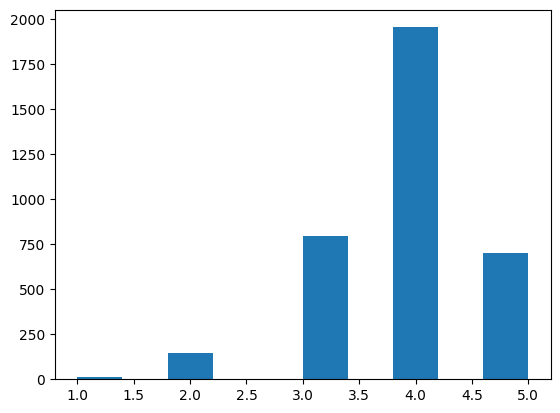

In [12]:
plt.hist(ovps)

In [13]:
df_test_per_smp_v2

,doid,disease,top_k_1,top_k_3,top_k_5,top_k_10,top_k_50,top_k_100,top_5_unique,top_10_pct,...,top_3_mean_dis,top_5_mean_dis,top_10_mean_dis,top_50_mean_dis,top_100_mean_dis,top_1_p90_dis,top_3_p90_dis,top_5_p90_dis,top_10_p90_dis,top_50_p90_dis
0,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:10941, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO...","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO...","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO..."
1,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3459, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D..."
2,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:3459, DOID:3910, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D..."
3,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3068, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D..."
4,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]

In [14]:
def plot_lollipop(x_vals, labels, title, metric, color):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D

    # numeric positions for categories
    xpos = np.arange(len(labels))

    plt.figure(figsize=(16, 6))
    plt.scatter(xpos, x_vals, color=color, s=30, zorder=3)  # dots

    # stems first (so dots appear on top)
    plt.vlines(np.arange(len(labels)), 0.0, x_vals, color=color, alpha=1, linewidth=2, zorder=2)

    # cosmetics
    plt.xticks(xpos, labels, rotation=90,)
    plt.margins(x=0.01, y=0.1)
    plt.ylim(-0.01, max(1, max(x_vals)) + 0.1)
    plt.grid(linestyle='--', alpha=0.7, zorder=-3)

    # labels / title (note: you're plotting average_precision, not AUROC)
    plt.xlabel("Disease")
    plt.ylabel(f"{metric}")
    plt.title(f"{title}")

    # legend entries for point and red segments
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()


In [15]:
df_test_per_smp_v2["n_related"]
df_test_per_smp_v2["n_same"]
df_test_per_smp_v2["n_unrelated"] 
df_test_per_smp_v2["total"] 

KeyError: 'n_related'

In [ ]:
# top k closest 
top_k = 5




d_2_k = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_dis"].sum().to_dict()
d_2_count = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_dis"].count().to_dict()
dis_val = {k: v / d_2_count[k] for k, v in d_2_k.items()}

d_uniq_2_k = df_test_per_smp_v2.groupby("disease")["n_unique_hits"].sum().to_dict()
d_uniq_2_count = df_test_per_smp_v2.groupby("disease")["n_unique_hits"].count().to_dict()
d_uniq_val = {k: v / d_uniq_2_count[k] for k, v in d_uniq_2_k.items()}

rel_2_k = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_rel"].sum().to_dict()
rel_2_count = df_test_per_smp_v2.groupby("disease")[f"top_{top_k}_rel"].count().to_dict()
rel_val = {k: v / rel_2_count[k] for k, v in rel_2_k.items()}



# get optimal disease order
_df_order = pd.DataFrame({
    "dis": dis_val.keys(),
    "val_1": dis_val.values(),
    "val_2": [rel_val.get(k, 0) for k in dis_val.keys()],
    "val_3": [d_uniq_val.get(k, 0) for k in dis_val.keys()]
})
dis_order = _df_order.sort_values(by=["val_1", "val_2"], ascending=[False, False])["dis"].to_list()

# plot values
x_vals = [dis_val.get(d, np.nan) for d in dis_order]
plot_lollipop(x_vals, dis_order, f"Hit Rate % Top {top_k} Closest for Same Diseases (Different DT)", metric="Hit Rate %", color="#2778ff")

x_vals = [rel_val.get(d, np.nan) for d in dis_order]
plot_lollipop(x_vals, dis_order, f"Hit Rate % Top {top_k} Closest for Related Diseases (Different DT)", metric="Hit Rate %", color="#ff5722")

dis_order = _df_order.sort_values(by=["val_3","val_1", "val_2"], ascending=[False, False, False])["dis"].to_list()
x_vals = [d_uniq_val.get(d, np.nan) for d in dis_order]
plot_lollipop(x_vals, dis_order, f"Hit Rate % Top {top_k} Closest for Unique Related Diseases (Different DT)", metric="Hit Rate %", color="#ff5722")

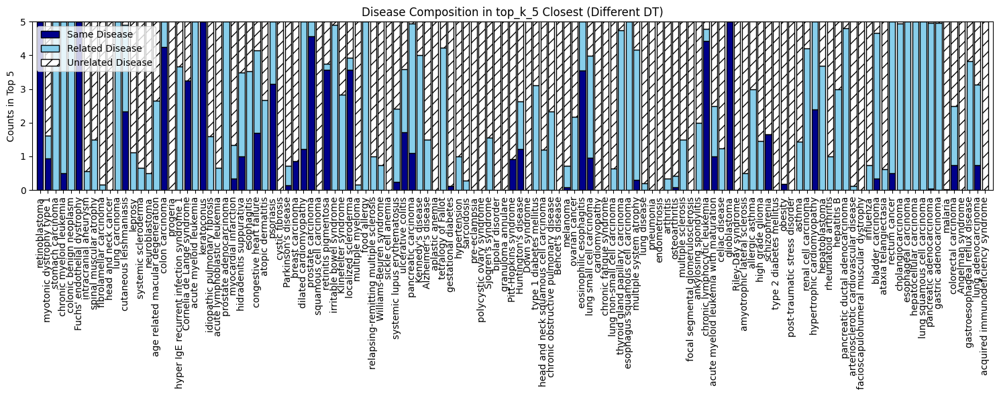

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


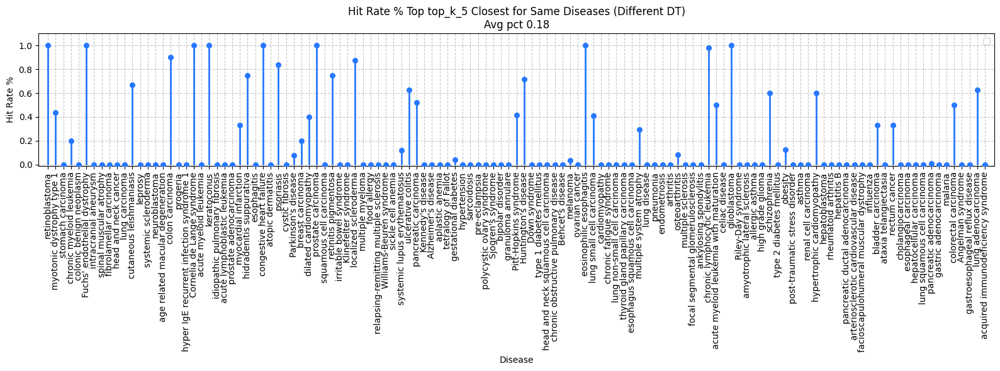

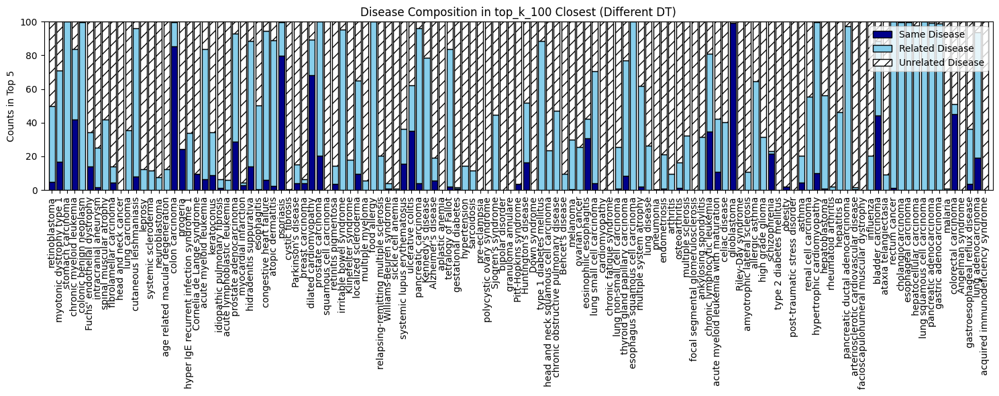

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


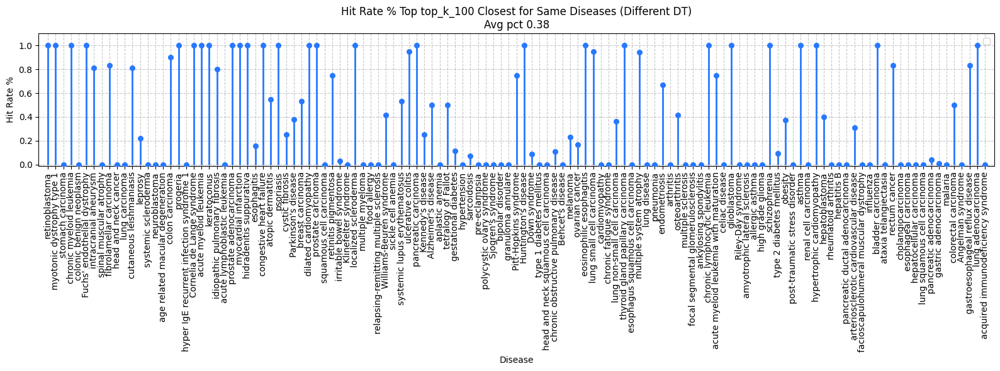

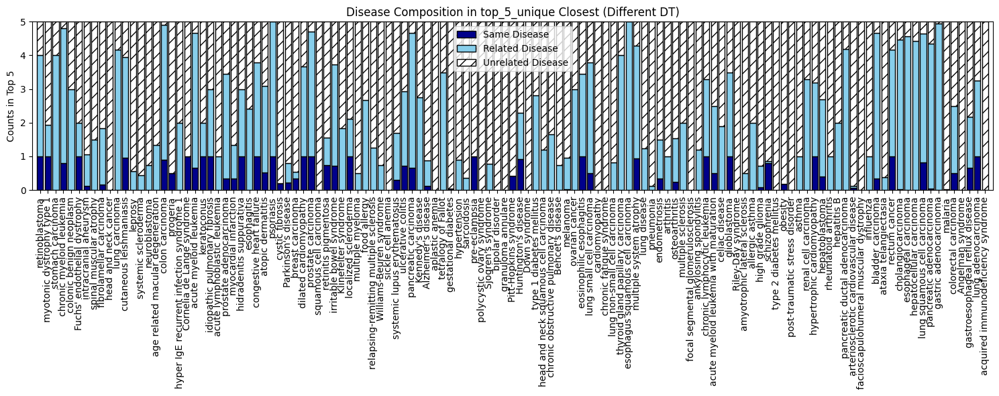

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


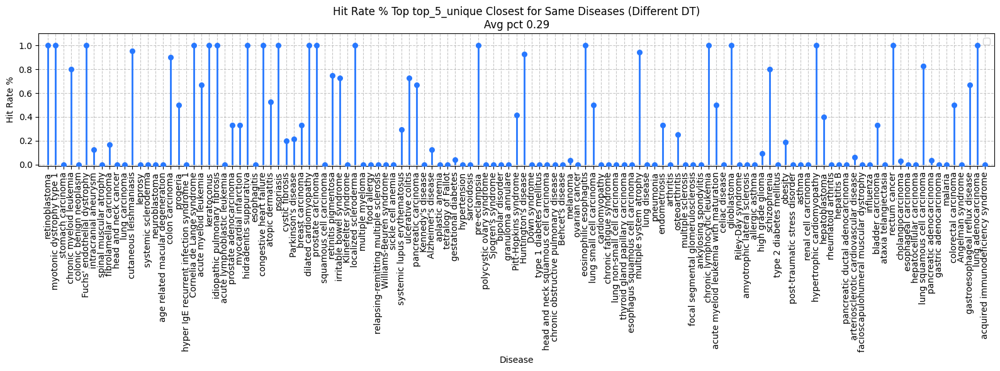

In [ ]:
# Precompute related lookups for fast membership tests
# (Using a set for lookup speed is fine; we still count duplicates by iterating the list.)
def get_counts(df:pd.DataFrame, rel_map:Dict, key_interest:str)->pd.DataFrame:
    df_query = df.copy()

    n_same, n_rel, n_unrel, n_total = [], [], [], []

    for _, r in df_query.iterrows():
        topk = list(r[key_interest])  # keep duplicates
        doid = r["doid"]
        related = rel_map.get(doid, set())

        same = sum(1 for x in topk if x == doid)           # absolute count of the exact disease
        rel  = sum(1 for x in topk if x in related)        # absolute count of related diseases (counts repeats)
        total = len(topk)
        unrel = total - same - rel

        n_same.append(same)
        n_rel.append(rel)
        n_unrel.append(unrel)
        n_total.append(total)

    df_query["n_same"]  = n_same
    df_query["n_rel"]   = n_rel
    df_query["n_unrel"] = n_unrel

    df_query["n_total"] = n_total
    df_query["n_unique_hits"] = df_query[key_interest].apply(lambda x: len(set(x)))
    return df_query

def barplot_composition(x_labels, vals_1, vals_2, vals_3, categories=["Same Disease", "Related Disease", "Unrelated Disease"], title="Disease composition", y_lab="Counts"):
    x = np.arange(len(x_labels))

    fig, ax = plt.subplots(figsize=(15, 6))

    # Stacked vertical bars
    ax.bar(x, vals_1, color="darkblue", label=categories[0], edgecolor="black")
    ax.bar(x,vals_2, bottom=vals_1,
                        color="skyblue", label=categories[1], edgecolor="black")
    ax.bar(
        x, vals_3,
        bottom=np.array(vals_1) + np.array(vals_2),
        color="white", edgecolor="black", hatch="//", label=categories[2]
    )

    # Labels and formatting
    ax.set_xticks(x)
    ax.set_xticklabels(dis_order, rotation=90)
    ax.set_ylabel(y_lab)
    ax.set_title(title)
    ax.legend()

    plt.margins(x=0.005, y=0.0)
    # plt.ylim(-0, 100)  # adjust if your totals differ
    plt.tight_layout()
    plt.show()


def plot_lollipop(x_vals, labels, title, metric, color):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.lines import Line2D

    # numeric positions for categories
    xpos = np.arange(len(labels))

    plt.figure(figsize=(16, 6))
    plt.scatter(xpos, x_vals, color=color, s=30, zorder=3)  # dots

    # stems first (so dots appear on top)
    plt.vlines(np.arange(len(labels)), 0.0, x_vals, color=color, alpha=1, linewidth=2, zorder=2)

    # cosmetics
    plt.xticks(xpos, labels, rotation=90,)
    plt.margins(x=0.01, y=0.1)
    plt.ylim(-0.01, max(1, max(x_vals)) + 0.1)
    plt.grid(linestyle='--', alpha=0.7, zorder=-3)

    # labels / title (note: you're plotting average_precision, not AUROC)
    plt.xlabel("Disease")
    plt.ylabel(f"{metric}")
    plt.title(f"{title}")

    # legend entries for point and red segments
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()


rel_map = {}
for d in pd.unique(df_test_per_smp_v2["doid"]):
    rel_map[d] = set(df_related.loc[df_related["do1"] == d, "do2"]) | \
                 set(df_related.loc[df_related["do2"] == d, "do1"])


key_interest = "top_k_5"
df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query["disease"].unique().tolist()

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")


key_interest = "top_k_100"
df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query["disease"].unique().tolist()

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")

key_interest = "top_5_unique"
df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query["disease"].unique().tolist()

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)
df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")


In [ ]:
key_interest = "top_5_unique"
df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query["disease"].unique().tolist()

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)

df_query["hits"] = df_query["n_same"] > 0
plot_lollipop([df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order], dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)", metric="Hit Rate %", color="#2778ff")


In [ ]:
def get_counts_enr(df:pd.DataFrame, rel_map:Dict, key_interest:str, pval_thr=0.1, k=None)->pd.DataFrame:
    df_query = df.copy()

    n_same, n_rel, n_unrel, n_total = [], [], [], []

    for _, r in df_query.iterrows():
        topk = list(r[key_interest])  # keep duplicates

        if k is not None:
            # sort by pval
            topk = sorted(topk, key=lambda x: x[1])[:k]
        
        # filter by pval
        topk = [x[0] for x in topk if x[1] <= pval_thr]

        doid = r["doid"]
        related = rel_map.get(doid, set())

        same = sum(1 for x in topk if x == doid)           # absolute count of the exact disease
        rel  = sum(1 for x in topk if x in related)        # absolute count of related diseases (counts repeats)
        total = len(topk)
        unrel = total - same - rel

        n_same.append(same)
        n_rel.append(rel)
        n_unrel.append(unrel)
        n_total.append(total)

    df_query["n_same"]  = n_same
    df_query["n_rel"]   = n_rel
    df_query["n_unrel"] = n_unrel

    df_query["n_total"] = n_total
    df_query["n_unique_hits"] = df_query[key_interest].apply(lambda x: len(set(x)))
    return df_query



In [ ]:
get_counts_enr(df_test_per_smp_v2, rel_map, "top_10_pct_enrichment", pval_thr=0.000000001)
# get_counts_enr(df_test_per_smp_v2, rel_map, "top_10_pct_enrichment", pval_thr=0.1)

,doid,disease,top_k_1,top_k_5,top_k_10,top_k_50,top_k_100,top_5_unique,top_10_pct,top_10_pct_enrichment,top_1_mean_dis,top_5_mean_dis,top_10_mean_dis,top_50_mean_dis,top_100_mean_dis,n_same,n_rel,n_unrel,n_total,n_unique_hits
0,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:10941, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:3907, 0.0415879999213353), (DOID:4007, ...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...",1,3,0,4,25
1,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3459, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:10941, 0.0415879999213353), (DOID:4007,...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,2,0,3,11
2,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:3459, DOID:3910, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:4007, 0.9585945454524885), (DOID:768, 3...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,2,0,3,9
3,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3068, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:3070, 0.1045949854028878), (DOID:10941,...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,3,0,4,9
4,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:3070, 0.1045949854028878), (DOID:10941,...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,3,0,4,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3606,DOID:3910,lung adenocarcinoma,[DOID:11612],"[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:3068, DOID:4007, D...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[(DOID:4007, 0.0), (DOID:5844, 0.0018287350145...",[DOID:4450],"[DOID:4450, DOID:4007, DOID:3068, DOID:768, DO...","[DOID:4450, DOID:4007, DOID:3068, DOID:768, DO...","[DOID:44

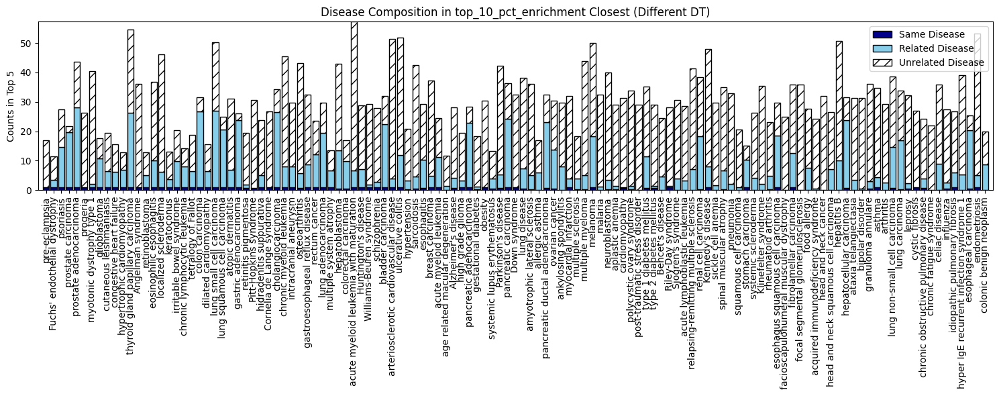

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


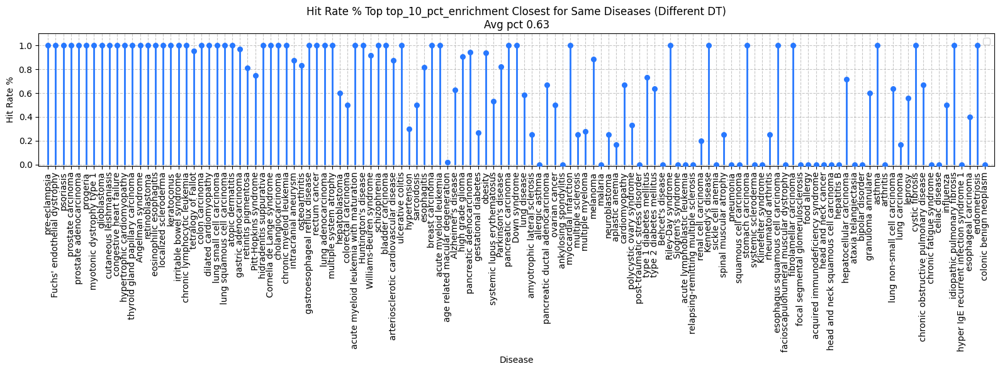

In [ ]:
key_interest = "top_10_pct_enrichment"
df_query = get_counts_enr(df_test_per_smp_v2, rel_map, "top_10_pct_enrichment", pval_thr=1, k=2000000)


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



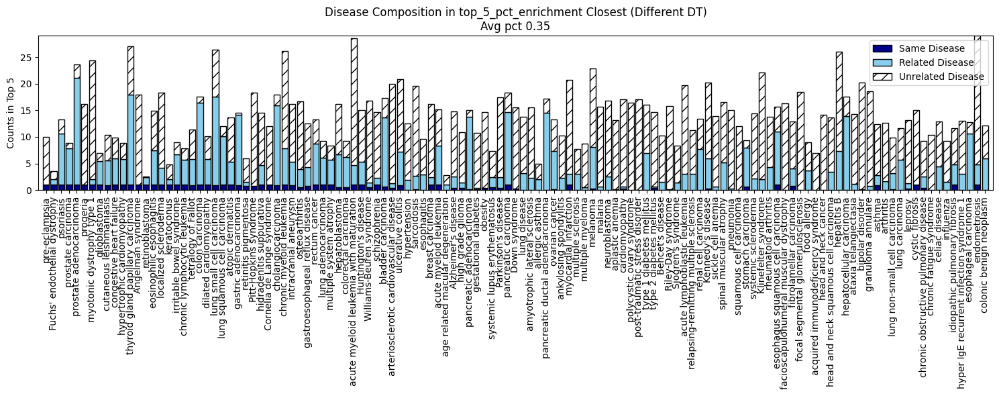

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


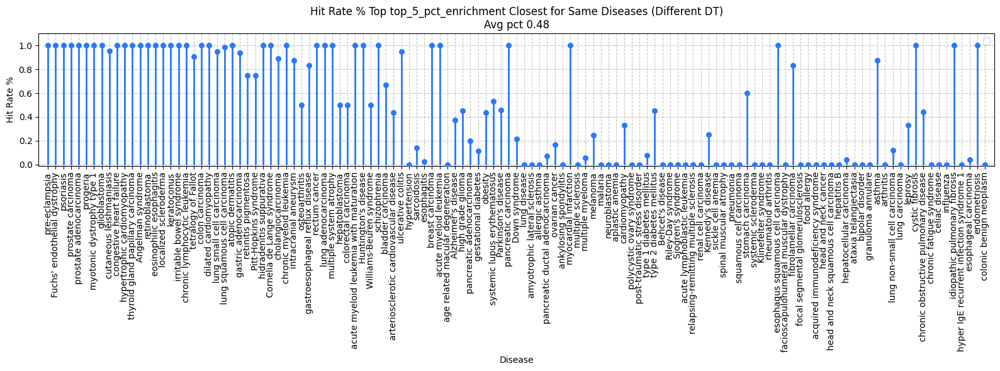

In [ ]:
key_interest = "top_5_pct_enrichment"
df_query = get_counts_enr(df_test_per_smp_v2, rel_map, "top_5_pct_enrichment", pval_thr=1, k=20000)


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



In [ ]:
p90 = 0 if len([]) < 1 else np.percentile([], 90)

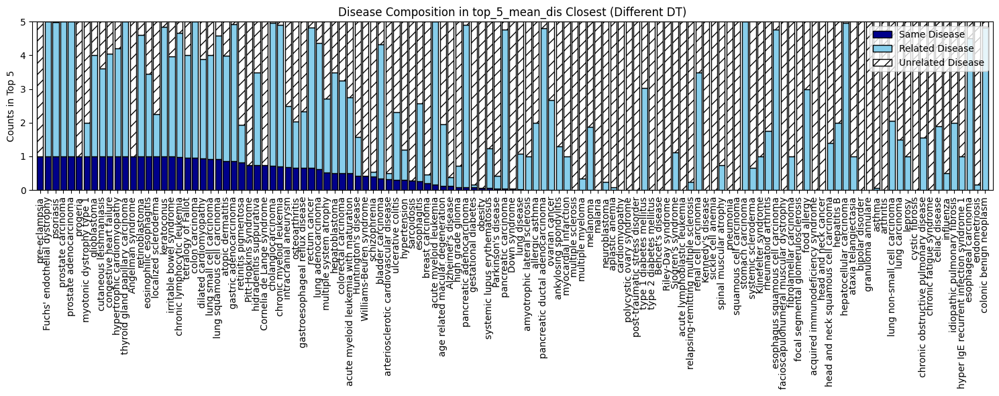

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


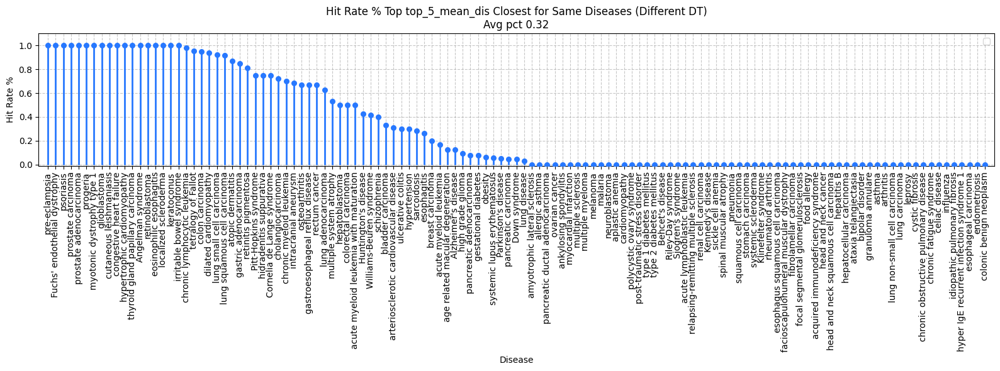

In [ ]:
key_interest = "top_5_mean_dis"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



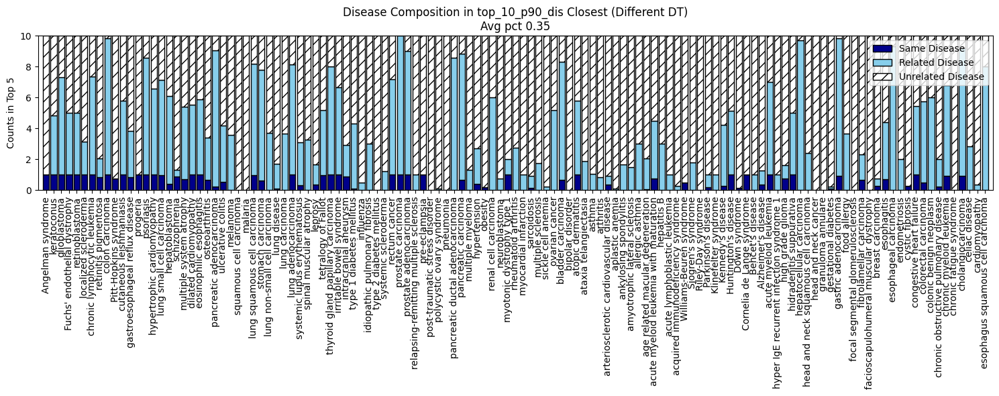

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


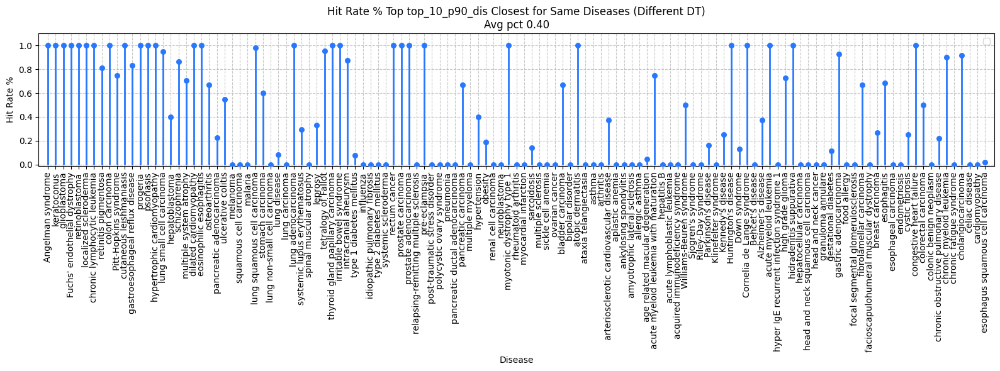

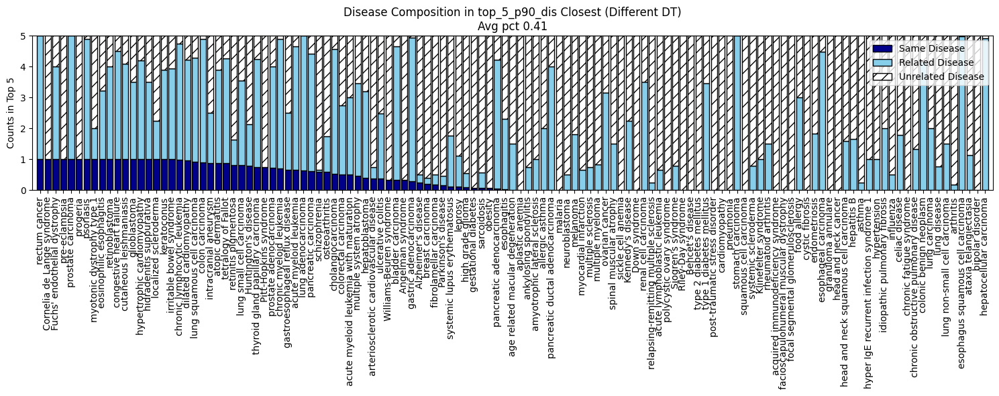

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


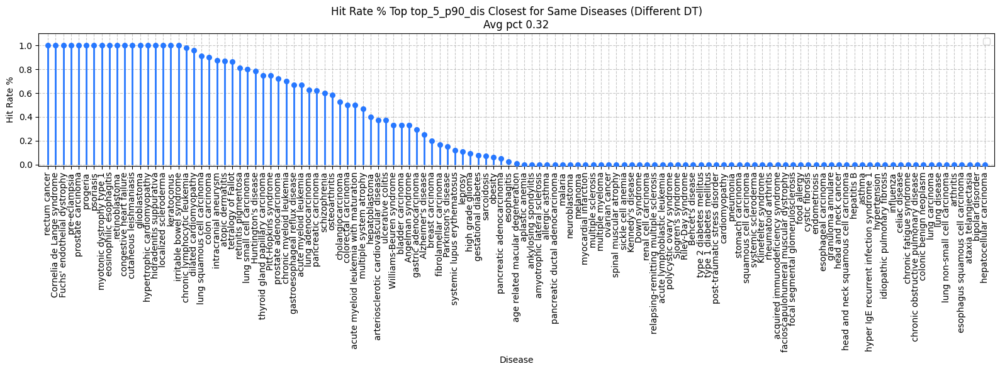

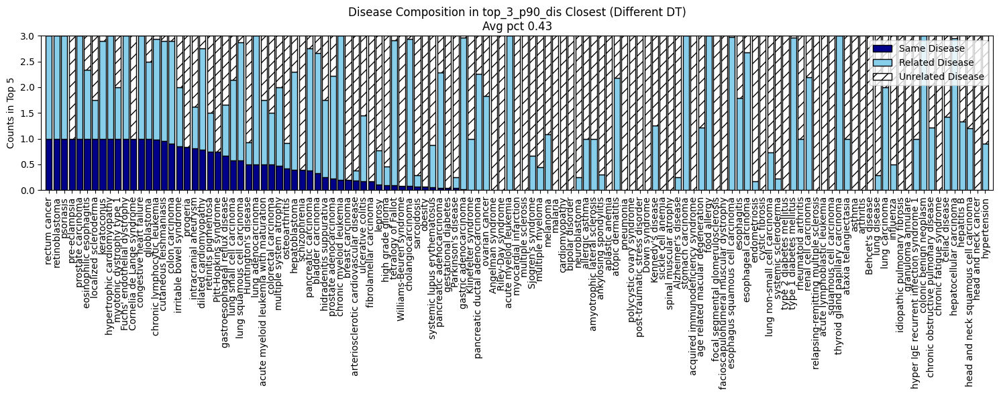

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


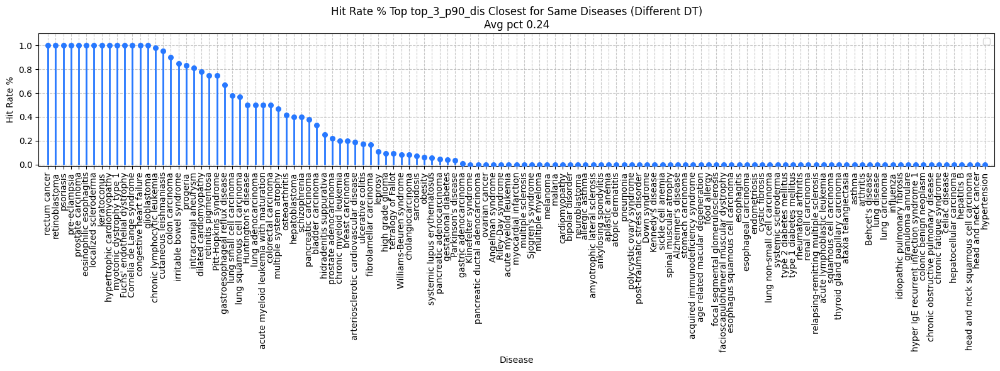

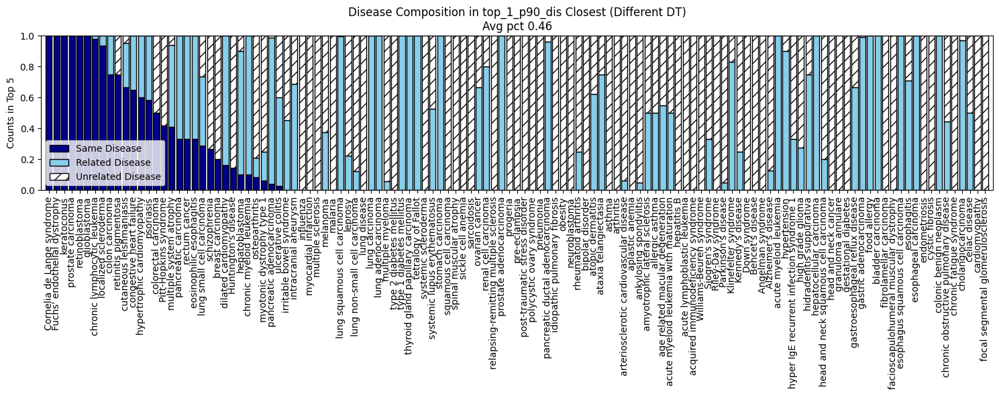

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


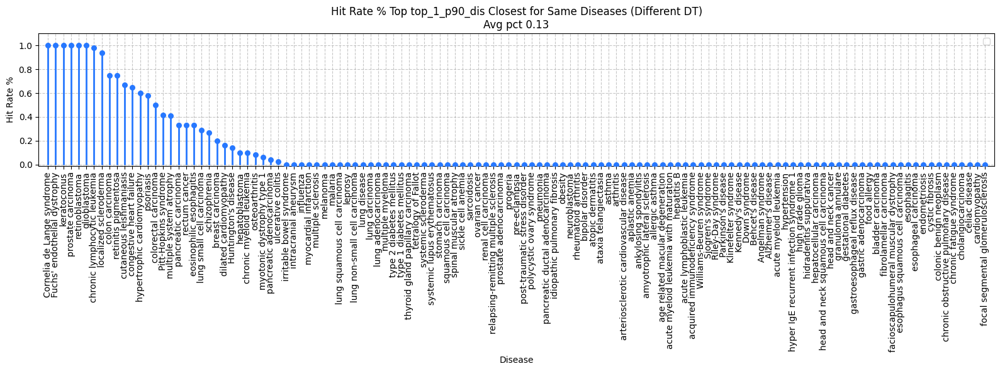

In [ ]:
key_interest = "top_10_p90_dis"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
# dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



key_interest = "top_5_p90_dis"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)





df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")


key_interest = "top_3_p90_dis"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")





key_interest = "top_1_p90_dis"

df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")




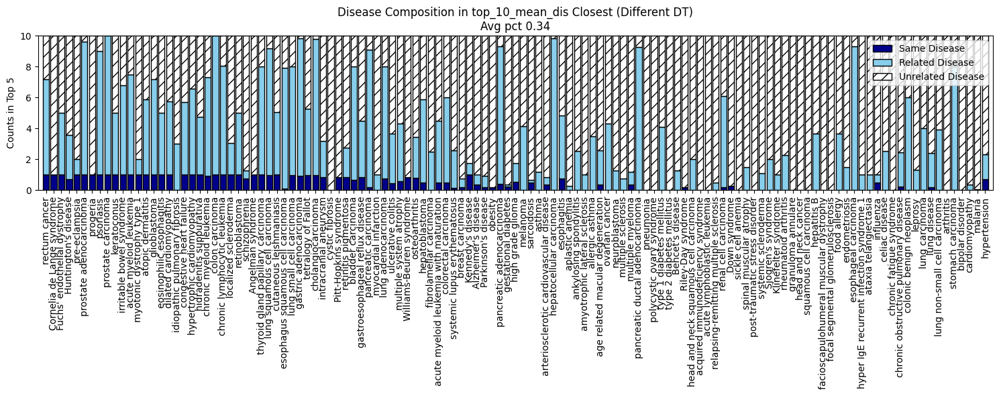

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


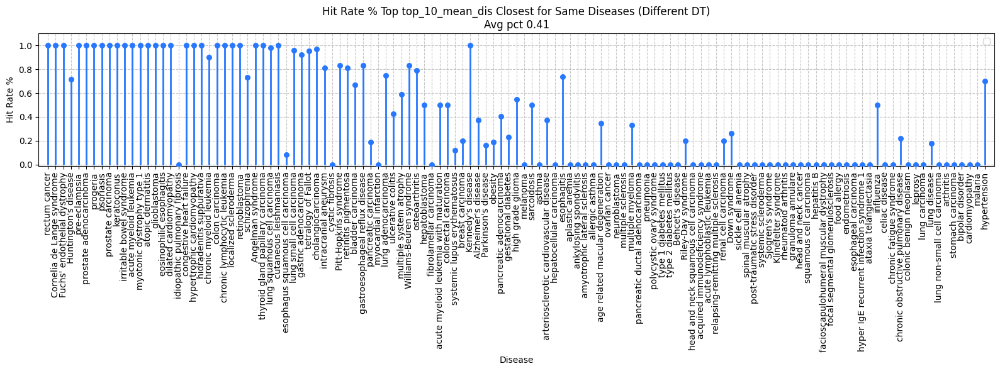

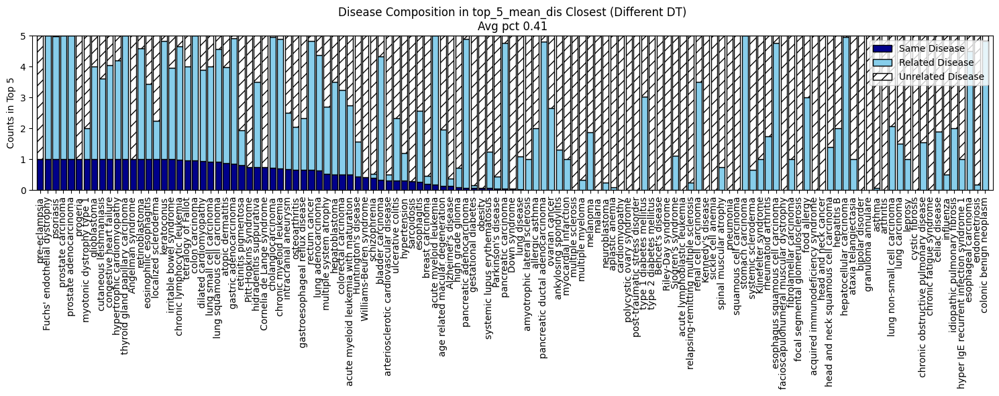

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


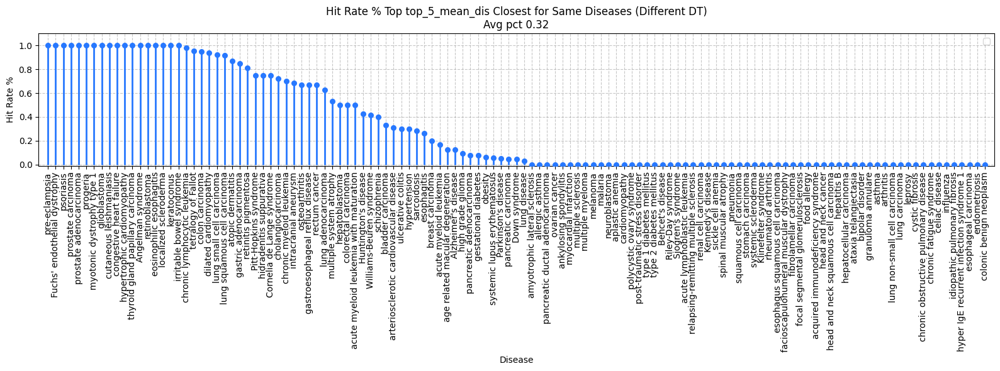

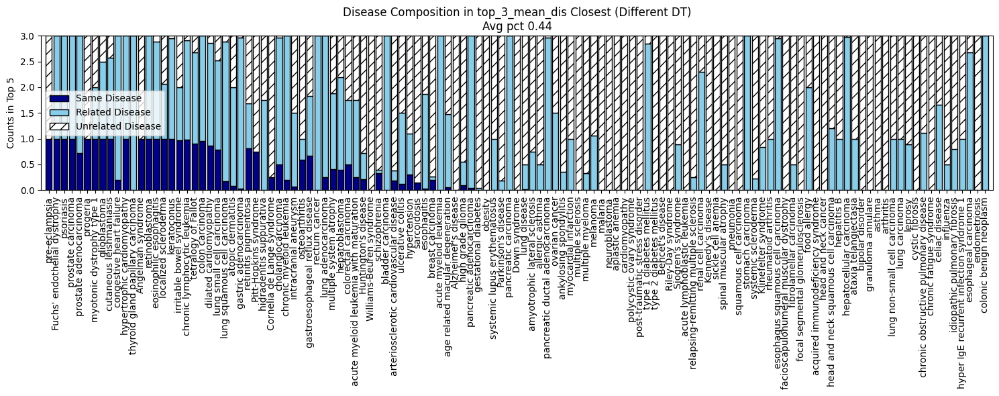

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


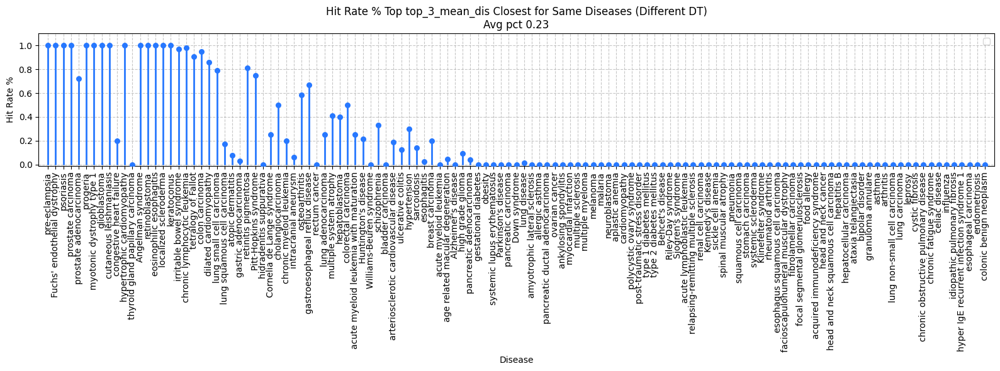

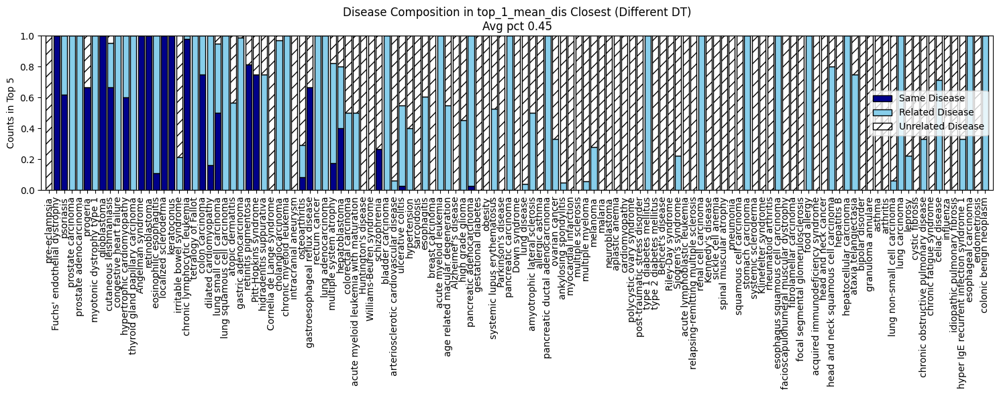

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


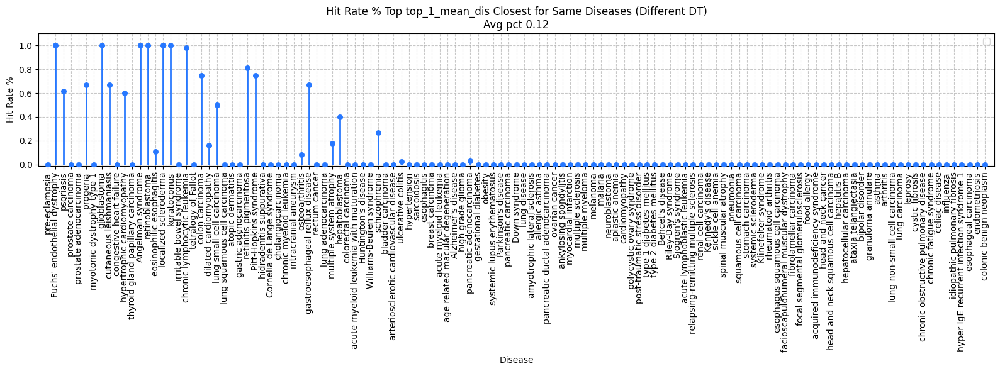

In [ ]:
key_interest = "top_10_mean_dis"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
# dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



key_interest = "top_5_mean_dis"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)





df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")


key_interest = "top_3_mean_dis"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
# dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")





key_interest = "top_1_mean_dis"

df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
# dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")




In [ ]:
key_interest = "top_1_mean_dis"

df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)\nAvg pct {1-df_query.groupby('disease')['pct_unrel'].mean().mean():.2f}",
    y_lab="Counts in Top 5"
)


df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")


In [ ]:
df_test_per_smp_v2

,doid,disease,top_k_1,top_k_3,top_k_5,top_k_10,top_k_50,top_k_100,top_5_unique,top_10_pct,...,top_3_mean_dis,top_5_mean_dis,top_10_mean_dis,top_50_mean_dis,top_100_mean_dis,top_1_p90_dis,top_3_p90_dis,top_5_p90_dis,top_10_p90_dis,top_50_p90_dis
0,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:10941, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO...","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO...","[DOID:768, DOID:10584, DOID:769, DOID:5409, DO..."
1,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3459, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D..."
2,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:3459, DOID:3910, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D...","[DOID:768, DOID:10584, DOID:11555, DOID:769, D..."
3,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3068, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...","[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",[DOID:768],"[DOID:768, DOID:10584, DOID:769]","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D..."
4,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768]","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...",...,"[DOID:768, DOID:10584, DOID:11555]

0.5503072827498994

0.2982553309332595

In [ ]:
key_interest = "top_1_pct_enrichment"


df_query = get_counts_enr(df_test_per_smp_v2, rel_map, key_interest, pval_thr=0.01, k=5)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)

df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



KeyError: 'top_1_pct_enrichment'

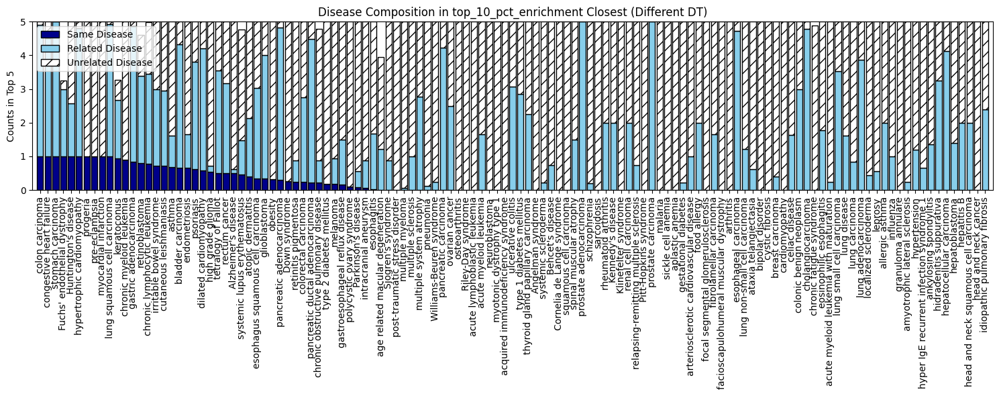

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


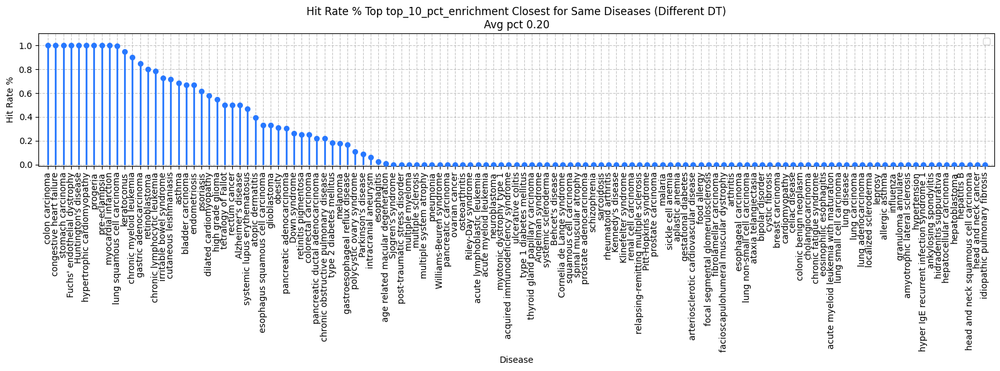

In [ ]:
key_interest = "top_10_pct_enrichment"


df_query = get_counts_enr(df_test_per_smp_v2, rel_map, key_interest, pval_thr=0.01, k=5)
dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)

df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



In [ ]:
get_counts_enr

<function __main__.get_counts_enr(df: pandas.core.frame.DataFrame, rel_map: Dict, key_interest: str, pval_thr=0.1, k=None) -> pandas.core.frame.DataFrame>

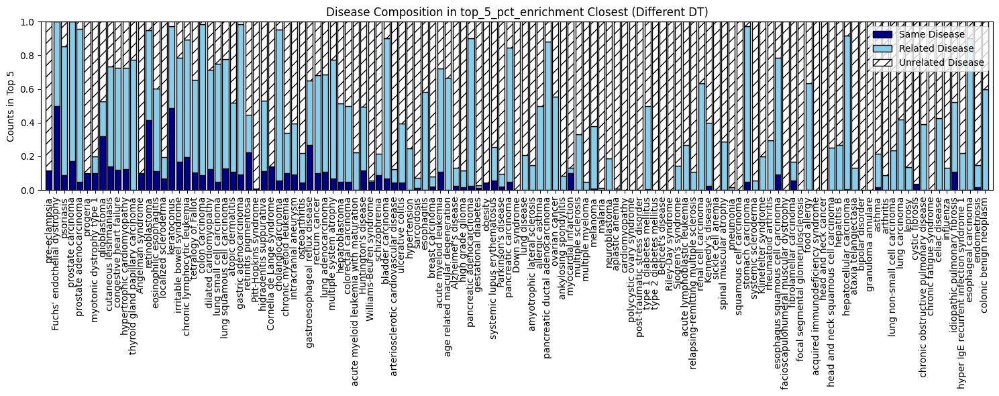

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


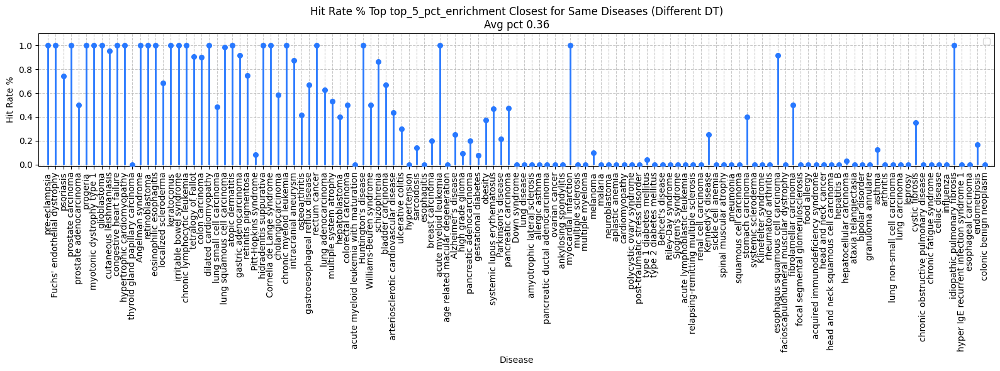

In [ ]:
key_interest = "top_5_pct_enrichment"


df_query = get_counts_enr(df_test_per_smp_v2, rel_map, key_interest, pval_thr=0.1, k=10)
# dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "pct_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "pct_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "pct_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)

df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



In [ ]:
df_query["n_total"].max()

10

In [ ]:
df_query.groupby("disease")["pct_same"].sum()

disease
Alzheimer's disease                  0.211111
Angelman syndrome                    0.215018
Behcet's disease                     0.000000
Cornelia de Lange syndrome           0.553571
Down syndrome                        0.000000
                                       ...   
tetralogy of Fallot                  2.207576
thyroid gland papillary carcinoma    0.187495
type 1 diabetes mellitus             0.090909
type 2 diabetes mellitus             0.000000
ulcerative colitis                   2.734805
Name: pct_same, Length: 123, dtype: float64

In [ ]:
df_query.groupby("disease")["pct_unrel"].sum()


disease
Alzheimer's disease                   6.934921
Angelman syndrome                     2.784982
Behcet's disease                      4.000000
Cornelia de Lange syndrome            3.446429
Down syndrome                        23.000000
                                       ...    
tetralogy of Fallot                   7.643434
thyroid gland papillary carcinoma     1.151895
type 1 diabetes mellitus             12.851371
type 2 diabetes mellitus             10.928571
ulcerative colitis                   23.641542
Name: pct_unrel, Length: 123, dtype: float64

In [ ]:
df_query.groupby("disease")["pct_rel"].sum()


disease
Alzheimer's disease                   0.853968
Angelman syndrome                     0.000000
Behcet's disease                      0.000000
Cornelia de Lange syndrome            0.000000
Down syndrome                         0.000000
                                       ...    
tetralogy of Fallot                  12.148990
thyroid gland papillary carcinoma     2.660609
type 1 diabetes mellitus             13.057720
type 2 diabetes mellitus              0.071429
ulcerative colitis                   13.623652
Name: pct_rel, Length: 123, dtype: float64

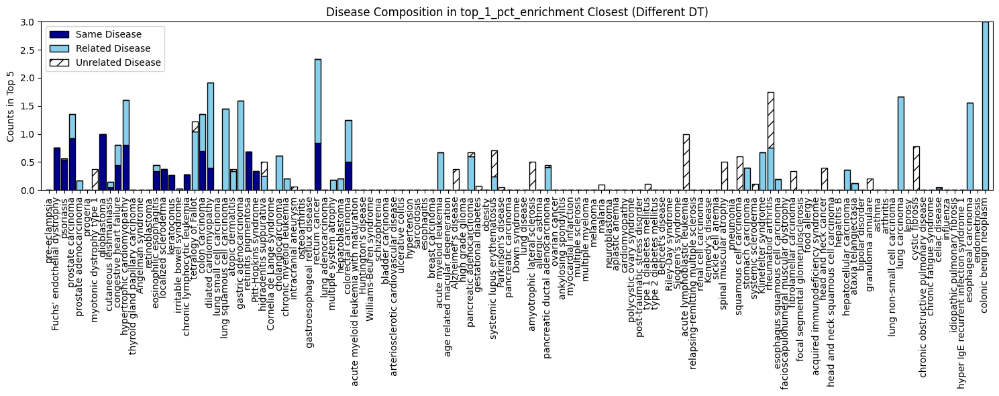

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


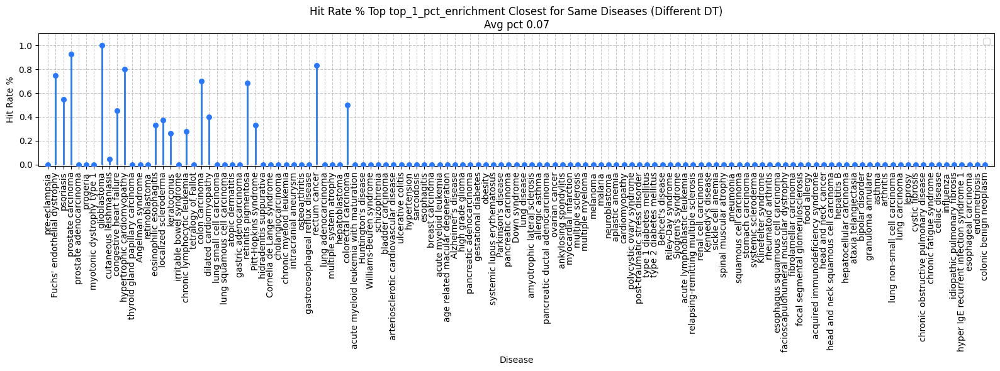

In [ ]:
key_interest = "top_1_pct_enrichment"


df_query = get_counts_enr(df_test_per_smp_v2, rel_map, key_interest, pval_thr=0.1)
# dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)

df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



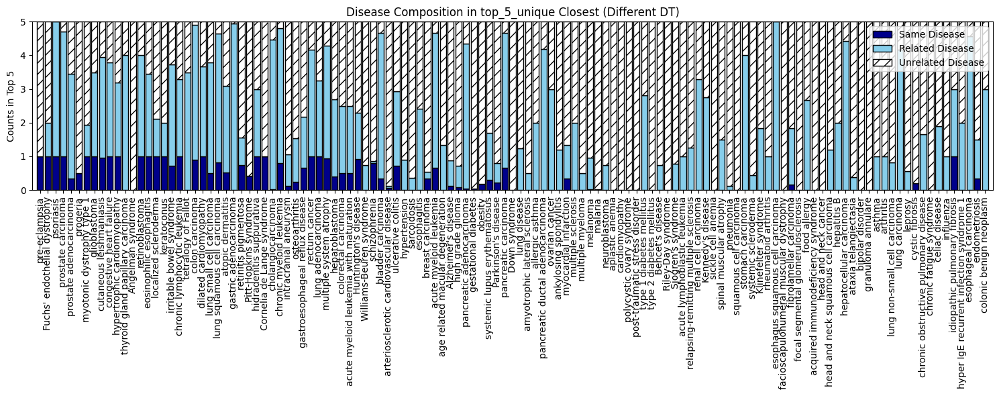

/tmp/ipykernel_1562920/3258113203.py:85: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


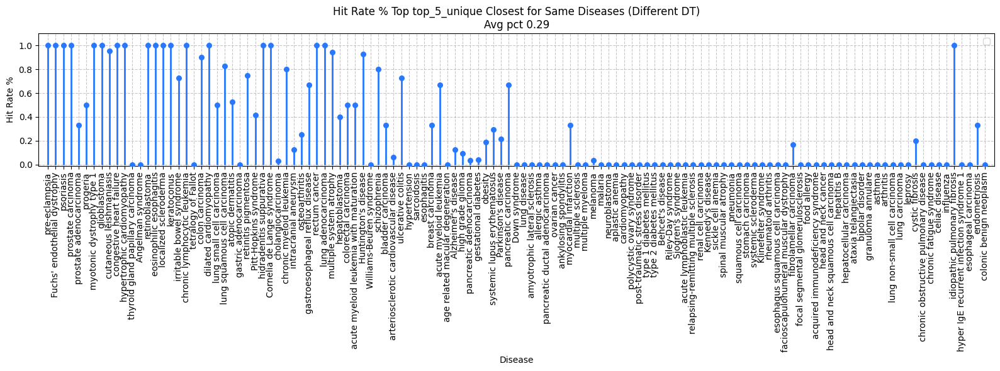

In [ ]:
key_interest = "top_5_unique"


df_query = get_counts(df_test_per_smp_v2, rel_map, key_interest,)
# dis_order = df_query.groupby("disease")["n_same"].mean().sort_values(ascending=False).index.to_list()


df_query["pct_same"] = df_query["n_same"] / df_query["n_total"]
df_query["pct_rel"] = df_query["n_rel"] / df_query["n_total"]
df_query["pct_unrel"] = df_query["n_unrel"] / df_query["n_total"]

barplot_composition(
    dis_order,
    [df_query.loc[df_query["disease"] == d, "n_same"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_rel"].mean() for d in dis_order],
    [df_query.loc[df_query["disease"] == d, "n_unrel"].mean() for d in dis_order],
    title=f"Disease Composition in {key_interest} Closest (Different DT)",
    y_lab="Counts in Top 5"
)

df_query["hits"] = df_query["n_same"] > 0
x_val = [df_query.loc[df_query["disease"] == d, "hits"].mean() for d in dis_order]
plot_lollipop(x_val, dis_order, f"Hit Rate % Top {key_interest} Closest for Same Diseases (Different DT)\nAvg pct {np.mean(x_val):.2f}", metric="Hit Rate %", color="#2778ff")



In [ ]:
df_test_per_smp_v2["top_5_unique"]

0       [DOID:768, DOID:10584, DOID:769, DOID:10941, D...
1       [DOID:768, DOID:10584, DOID:769, DOID:3459, DO...
2       [DOID:768, DOID:10584, DOID:3459, DOID:3910, D...
3       [DOID:768, DOID:10584, DOID:769, DOID:3068, DO...
4       [DOID:768, DOID:10584, DOID:769, DOID:11555, D...
                              ...                        
3606    [DOID:11612, DOID:289, DOID:3068, DOID:4007, D...
3607    [DOID:2377, DOID:1520, DOID:3459, DOID:3310, D...
3608    [DOID:2377, DOID:3459, DOID:1520, DOID:2394, D...
3609    [DOID:2377, DOID:12858, DOID:3044, DOID:4752, ...
3610    [DOID:2377, DOID:3044, DOID:3310, DOID:12858, ...
Name: top_5_unique, Length: 3611, dtype: object

['acute lymphoblastic leukemia',
 'acquired immunodeficiency syndrome',
 'pneumonia',
 'polycystic ovary syndrome',
 'chronic fatigue syndrome',
 'granuloma annulare',
 'focal segmental glomerulosclerosis',
 'bipolar disorder',
 'arthritis',
 'head and neck cancer',
 'type 2 diabetes mellitus',
 'sickle cell anemia',
 'squamous cell carcinoma',
 'facioscapulohumeral muscular dystrophy',
 'cystic fibrosis',
 'post-traumatic stress disorder',
 'malaria',
 'obesity',
 'Riley-Day syndrome',
 'aplastic anemia',
 'Down syndrome',
 'cardiomyopathy',
 'gestational diabetes',
 'relapsing-remitting multiple sclerosis',
 'sarcoidosis',
 'breast carcinoma',
 'multiple sclerosis',
 'arteriosclerotic cardiovascular disease',
 'Pitt-Hopkins syndrome',
 'Williams-Beuren syndrome',
 "Parkinson's disease",
 "Alzheimer's disease",
 'hyper IgE recurrent infection syndrome 1',
 'influenza',
 'progeria',
 'Angelman syndrome',
 'amyotrophic lateral sclerosis',
 'ataxia telangiectasia',
 'Klinefelter syndrome

In [ ]:
df_query

,doid,disease,top_k_1,top_k_5,top_k_10,top_k_50,top_k_100,top_5_unique,top_10_pct,top_10_pct_enrichment,...,top_100_mean_dis,n_same,n_rel,n_unrel,n_total,n_unique_hits,pct_same,pct_rel,pct_unrel,hits
0,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:10941, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:3907, 0.0415879999213353), (DOID:4007, ...",...,"[DOID:768, DOID:10584, DOID:11555, DOID:769, D...",1,3,1,5,5,0.2,0.6,0.2,True
1,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3459, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:10941, 0.0415879999213353), (DOID:4007,...",...,"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,4,0,5,5,0.2,0.8,0.0,True
2,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:3459, DOID:3910, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:4007, 0.9585945454524885), (DOID:768, 3...",...,"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,3,1,5,5,0.2,0.6,0.2,True
3,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:3068, DO...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:3070, 0.1045949854028878), (DOID:10941,...",...,"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,4,0,5,5,0.2,0.8,0.0,True
4,DOID:768,retinoblastoma,[DOID:768],"[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[DOID:768, DOID:10584, DOID:769, DOID:11555, D...","[DOID:768, DOID:768, DOID:768, DOID:768, DOID:...","[(DOID:3070, 0.1045949854028878), (DOID:10941,...",...,"[DOID:768, DOID:10584, DOID:11555, DOID:10126,...",1,4,0,5,5,0.2,0.8,0.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3606,DOID:3910,lung adenocarcinoma,[DOID:11612],"[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[DOID:11612, DOID:289, DOID:3068, DOID:4007, D...","[DOID:11612, DOID:289, DOID:289, DOID:3068, DO...","[(DOID:4007, 0.0), (DOID:5844, 0.0018287350145...",...,"[DOID:4450, DOID:4007, DOID:3068, DOID:768, DO...",0,4,1,5,5,0.0,0.8,0.2,False
3607,DOID:635,acquired immunodeficiency syndrome,[DOID:2377],"[DOID:2377, DOID:2377, DOID:2377, DOID:2377, D...","[DOID:2377, DOID:2377, DOID:2377, DOID:2377, D...","[DOID:2377, DOID:2377, DOID:2377, DOID:2377, D...","[DOID:2377, DOID:2377, DOID:2377, DOID:2377, D...","[DOID:2377, DOID:1520, DOID:3459, DOID:3310, D...","[DOID:2377, DOID:2377, DOID:2377, DOID:2377, D...","[(DOID:12858, 2.082402317009365e-05), (DOID:28...",...,"[DOID:3044, DOID:9415, DOID:10871, DOID:2394, ...",0,0,5,5,5,0.0,0.0,1.0,False
3608,DOID:635,acquired immunodeficiency syndrome,[DOID:2377],"[DOID:2377, DOID:3459, DOID:1520, DOID:1520, D...","[DOID:2377, DOID:3459, DOID:1520, DOID:1520, D...","[DOID:2377, DOID:3459, DOID:1520, DOID:1520, D...","[DOID:2377, DOID:3459, DOID:1520, DOID:1520, D...","[DOID:2377, DOID:

In [16]:
import numpy as np

def csls_from_matrix(c_matrix, k=10):
    """
    Compute CSLS scores given a precomputed cosine similarity matrix (query x reference).
    Both query and reference vectors assumed to be L2-normalized when computed.
    """
    # mean similarity of each reference to its k nearest queries
    knn_ref = np.partition(c_matrix, -k, axis=0)[-k:, :]  # shape (k, n_ref)
    mean_ref = knn_ref.mean(axis=0)                       # [n_ref]

    # mean similarity of each query to its k nearest references
    knn_qry = np.partition(c_matrix, -k, axis=1)[:, -k:]  # shape (n_q, k)
    mean_qry = knn_qry.mean(axis=1)                       # [n_q]

    csls = 2 * c_matrix - mean_ref[np.newaxis, :] - mean_qry[:, np.newaxis]
    return csls


def mutual_knn_mask(c_matrix, k=10):
    """
    Compute a boolean mask (n_q, n_r) for mutual kNN pairs in a similarity matrix.
    """
    top_q = np.argsort(c_matrix, axis=1)[:, ::-1][:, :k]
    top_r = np.argsort(c_matrix, axis=0)[::-1, :][:k, :]

    n_q, n_r = c_matrix.shape
    mutual = np.zeros((n_q, n_r), dtype=bool)

    for i in range(n_q):
        for j in top_q[i]:
            if i in top_r[:, j]:
                mutual[i, j] = True
    return mutual


def snn_weight(c_matrix, k=10):
    """
    Compute shared-neighbor (SNN) weights for each (query, ref) pair.
    Returns matrix of same shape as c_matrix.
    """
    n_q, n_r = c_matrix.shape
    top_q = np.argsort(c_matrix, axis=1)[:, ::-1][:, :k]
    top_r = np.argsort(c_matrix, axis=0)[::-1, :][:k, :]

    snn = np.zeros((n_q, n_r))
    for i in range(n_q):
        q_set = set(top_q[i])
        for j in top_q[i]:
            r_set = set(top_r[:, j])
            snn[i, j] = len(q_set & r_set) / len(q_set | r_set)
    return snn


csls_test_vs_train = csls_from_matrix(c_matrix_test_vs_train, k=10)


In [39]:
np.sort(csls_test_vs_train[16])[::-1][:10]

array([0.04079648, 0.03813036, 0.03059434, 0.0248155 , 0.02328047,
       0.01586304, 0.01241823, 0.01200384, 0.01157539, 0.01032193])